# Area Processing Tutorial

Utility tools, test images are loading correctly.

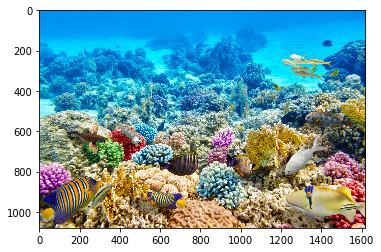

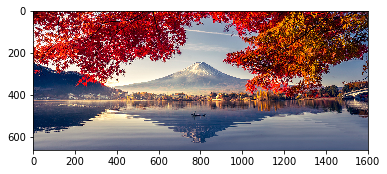

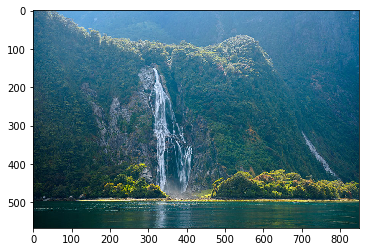

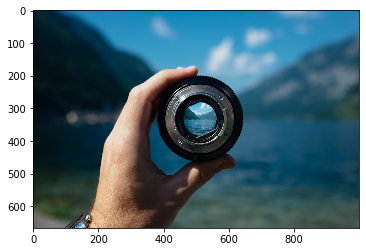

In [1]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.image import imread
import time

images = {}
for x in os.listdir("images"):
    images[x] = cv2.imread("images/" + x)
    temp = images[x][:,:,::-1]
    plt.imshow(temp, interpolation='nearest')
    plt.show()
    

<b style="font-size:18px;">Exercise 1.1: Sliding Window</b>

Create a function using python that creates an nxn sliding window that strides through an image.

Your function should accept three parameters, an image (to slide through), the n dimension of the window and the stride value s. 
<i style="color:red">(Stride simply refers to the amount of pixels the window moves through kind of like “speed”, for computational purposes in practise we rarely slide the window at a speed of 1 pixel)</i>

The function does not return anything, but internally it should display a matrix of pixel values that displays the current region the sliding window is in. <i style="color:red">(You can also if you want display the sliding window values as an image using cv2.imshow() this could potentially help you debug any errors you might have or show the sliding window moving on the image using cv2.rectange() )</i>


##### Implementation 
The functions takes in an image, a size for a window (this will be what is moving over the image), and a stride value, (which indicates by how many pixels the window will move). The function loops over the x and y axis of the image by a factor of the stride value. At each instance it creates a rectangle the same size specified by the windowSize parameter. This window is then moved across the image.

In [2]:
# Note:
# shape[0] = height
# shape[1] = width

def slidingWindow(inputImage, windowSize, strideValue): # windowSize is height, width
    # slide a window across the image
	for y in range(0, inputImage.shape[0], strideValue): 
		for x in range(0, inputImage.shape[1], strideValue):
			clone = inputImage.copy() # creates a clone to not ruin the input image with boxes  
			cv2.rectangle(clone, (x, y), (x + windowSize[1], y + windowSize[0]), (0, 255, 0), 2) # creates window 
			cv2.imshow("Window", clone)
			cv2.waitKey(1)
			time.sleep(0.025) # wait so it does not move to fast
			

slidingWindow(images[os.listdir("images")[2]], [50, 50], 20)
cv2.destroyAllWindows()

<b style="font-size:18px;">Exercise 1.2: Convolution on RoI</b>

Create a function that convolves an nxn region of an image with a Sobel kernel. 

Your function should accept the region of interest (ROI) of the image of nxn dimensions, and a kernel.

##### Implementation

To start, the function conv was created. The function takes in a region of interest and a kernel. The kernel is applied to this ROI and returns a value for the red, green and blue channels. Next, the convolution2 function was created. This function slides a window across an image, convoluting each section as it goes. 

In [14]:
def conv(roi, kernel):
    gxb = np.sum(np.multiply(kernel, roi[0]))
    gxr = np.sum(np.multiply(kernel, roi[1]))
    gxg = np.sum(np.multiply(kernel, roi[2]))

    return gxb, gxr, gxg

def convolution2(roi, kernel):
    b_img, g_img, r_img = cv2.split(roi)
    [rows, cols] = np.shape(b_img)
    kernelSize = kernel.shape

    g = np.zeros(shape=(rows - kernelSize[0], cols - kernelSize[1]))
    b = np.zeros(shape=(rows - kernelSize[0], cols - kernelSize[1]))
    r = np.zeros(shape=(rows - kernelSize[0], cols - kernelSize[1]))

    for i in range(rows - kernelSize[0] -1): #rows
        for j in range(cols - kernelSize[1] -1): #col
            # gxb = np.sum(np.multiply(kernel, b_img[i:(i + kernelSize[0]), j:(j + kernelSize[1])]))
            # gxr = np.sum(np.multiply(kernel, r_img[i:i + kernelSize[0], j:j + kernelSize[1]]))
            # gxg = np.sum(np.multiply(kernel, g_img[i:i + kernelSize[0], j:j + kernelSize[1]]))

            gxb, gxr, gxg = conv([b_img[i:(i + kernelSize[0]), j:(j + kernelSize[1])], r_img[i:i + kernelSize[0], j:j + kernelSize[1]], g_img[i:i + kernelSize[0], j:j + kernelSize[1]]],  kernel)

            g[i + 1, j + 1] = np.sqrt(gxg ** 2)
            b[i + 1, j + 1] = np.sqrt(gxb ** 2)
            r[i + 1, j + 1] = np.sqrt(gxr ** 2)
    
    filtered_image = cv2.merge((b, g, r))
    
    fig = plt.figure(figsize=(25, 20))
    ax1, ax2= fig.add_subplot(121), fig.add_subplot(122)
    ax1.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))

    img_float32 = np.float32(filtered_image)
    ax2.imshow(cv2.cvtColor(img_float32, cv2.COLOR_BGR2RGB).astype('uint8'), interpolation = "nearest")
    fig.show()

    return filtered_image


Display the result for the various images provided on VLE <i style="color:red">(You may start the exercise by converting the image to grayscale, ultimately your function should be able to process RGB Images)<i>

C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\1147780980.py:37: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


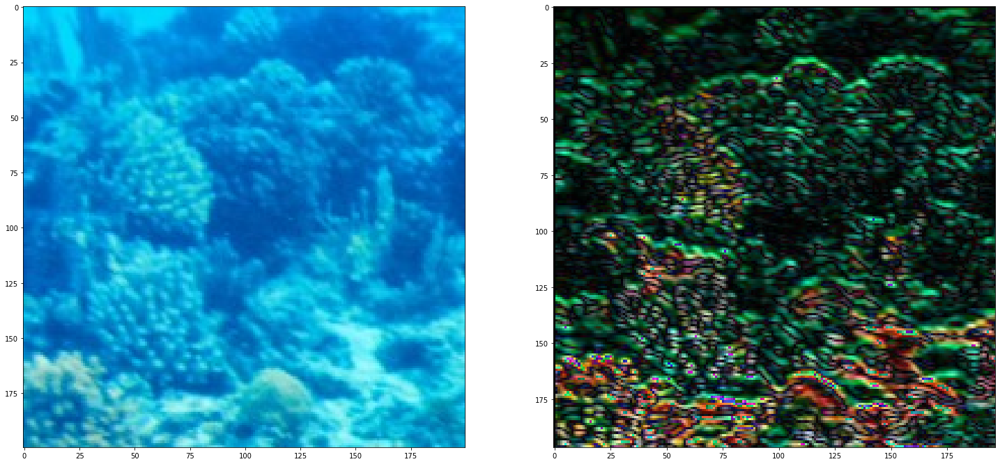

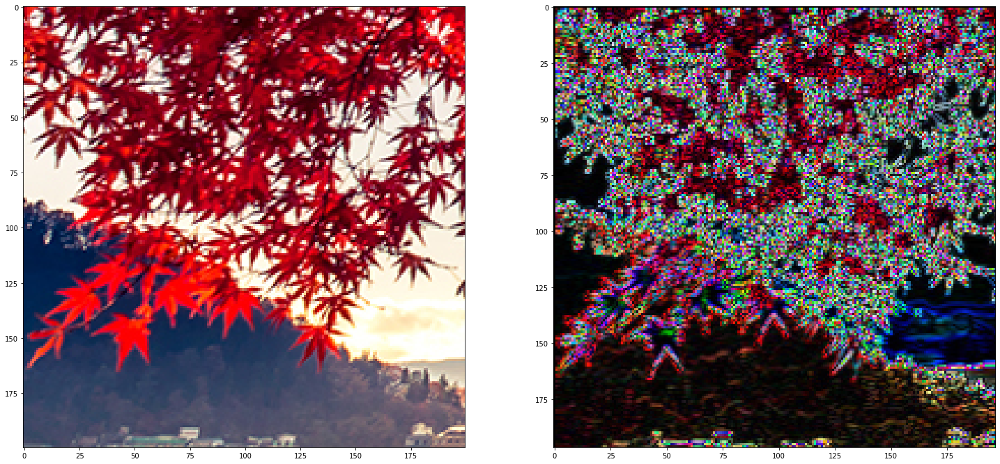

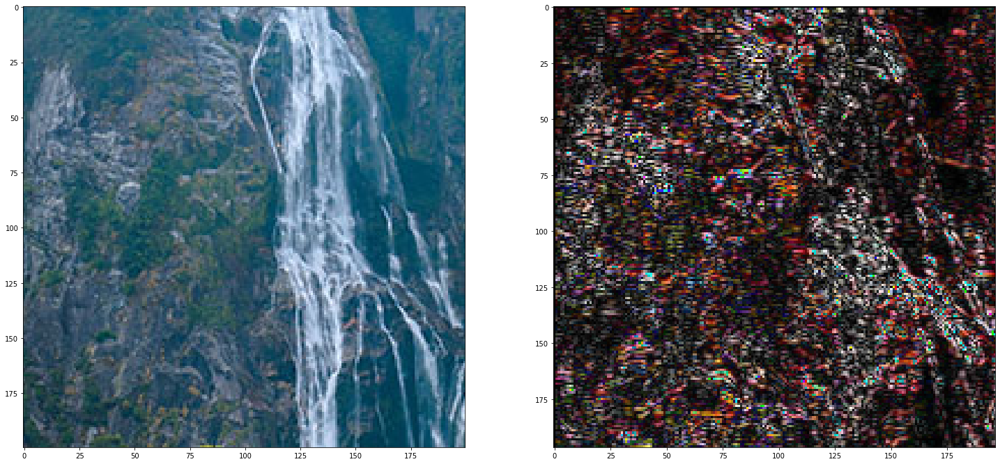

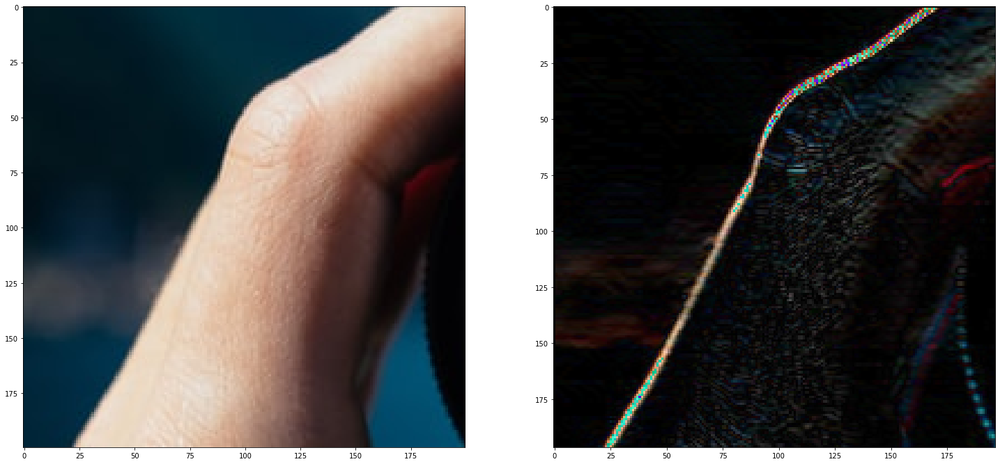

In [11]:
for counter in range(0, 4):
    input = images[os.listdir("images")[counter]][200: 400, 200:400]
    Gy = np.array([[1.0, 2.0, 1.0], [0.0, 0.0, 0.0], [-1.0, -2.0, -1.0]])
    output = convolution2(input, Gy)

<b style="font-size:18px;">Exercise 1.3: Convolution on the whole image</b>
    
Create a script that uses the sliding window and the convolution functions (Sobel) to convolve a whole image.

The script should output an image displaying the original image and the convolved image.

Use histograms to compare how the intensities of the image has changed.

<i style="color:red">Use the images provided on VLE</i>

##### Implementation 

To convolute the whole image, the functions created above where used. To plot the histograms of how the images changed after convolution, the plotHist function was made. The function takes in 2 images, an images before and after convolution. It then splits the image into the 3 colour channels and plots a line for each. The decision was made to use lines instead of bars to make it easier to see.

As we can see from the output histograms, applying the sobel kernel forces each colour channel to be more intense  at lower values, and taper off as the values increase. My assumption is that this is happening as a large amount of the image (the parts which are not edges) are black. This means they have an RGB value of [0,0,0] contributing to the high values close to 0. Therefore, there are less high values in the image, and flattens out as it approaches 0

C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\1974327984.py:37: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\493838762.py:10: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\1974327984.py:37: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\493838762.py:10: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\1974327984.py:37: UserWarning: Matplotlib is currently using mod

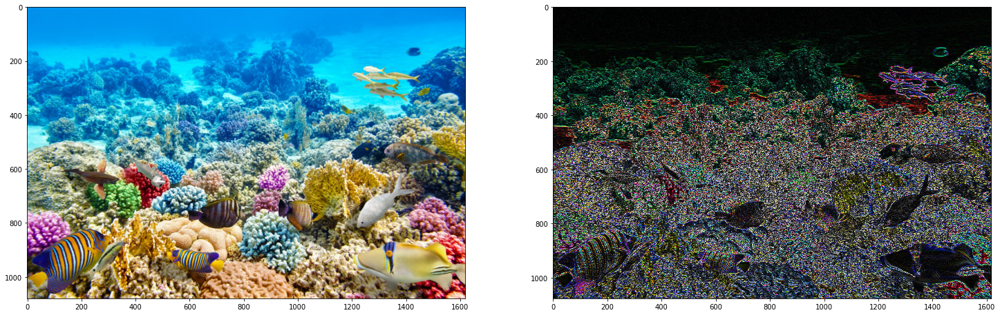

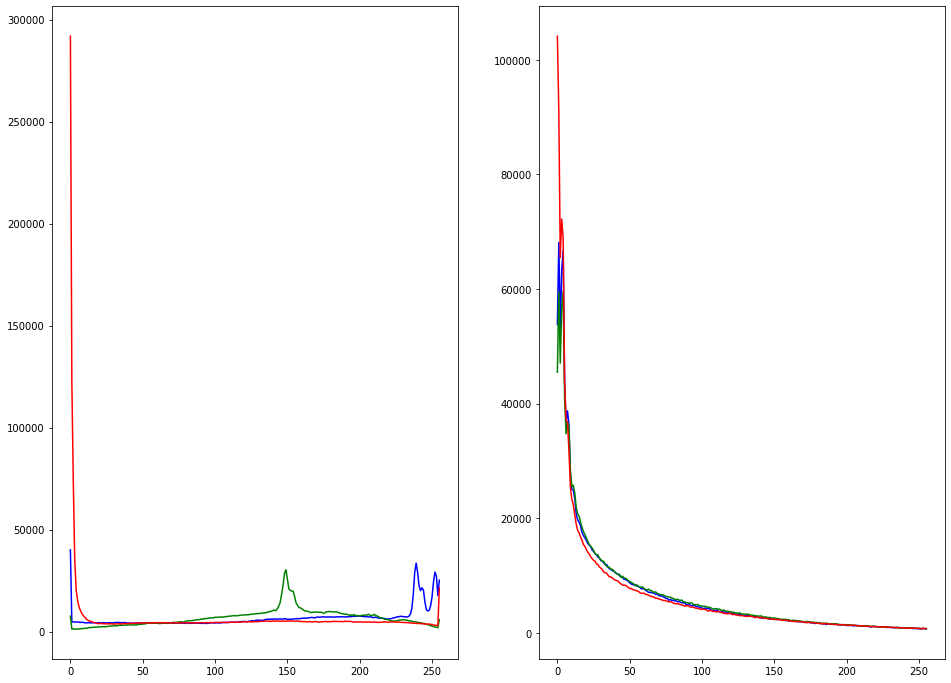

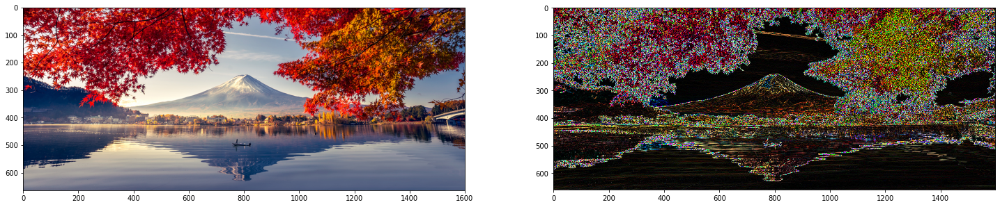

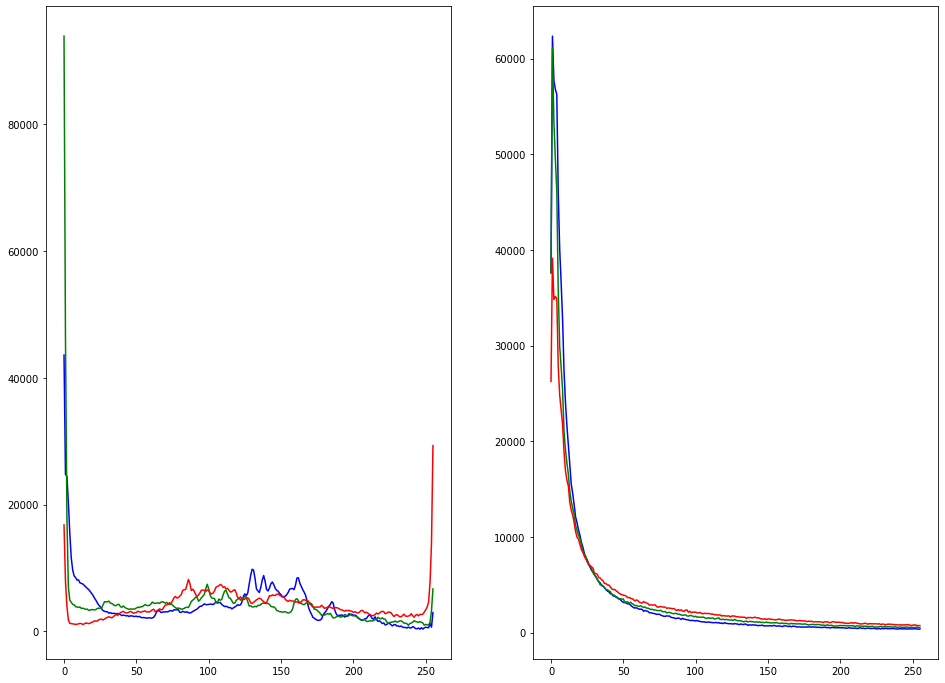

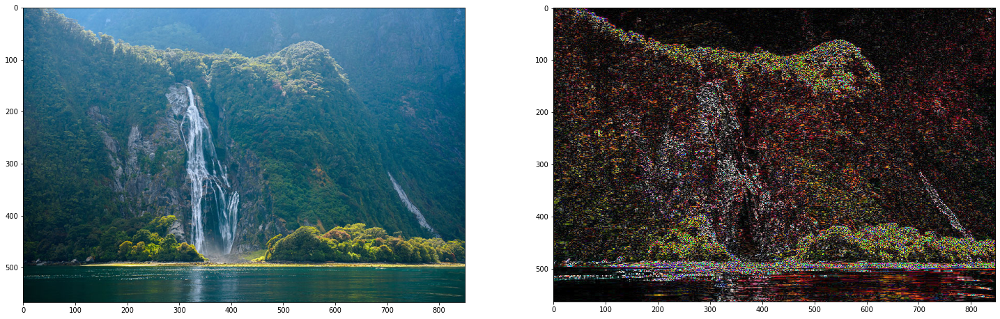

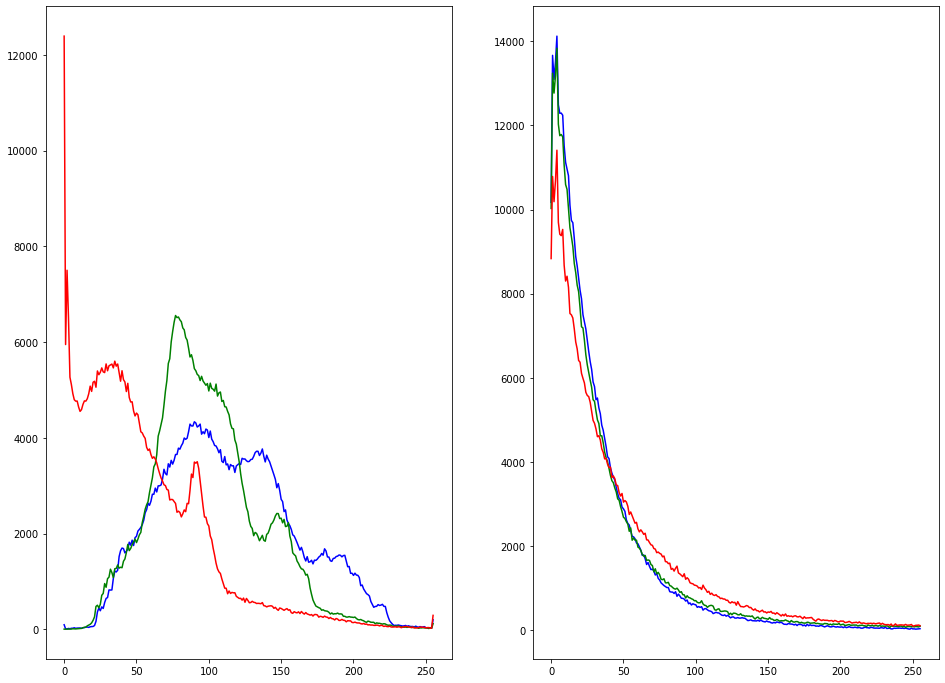

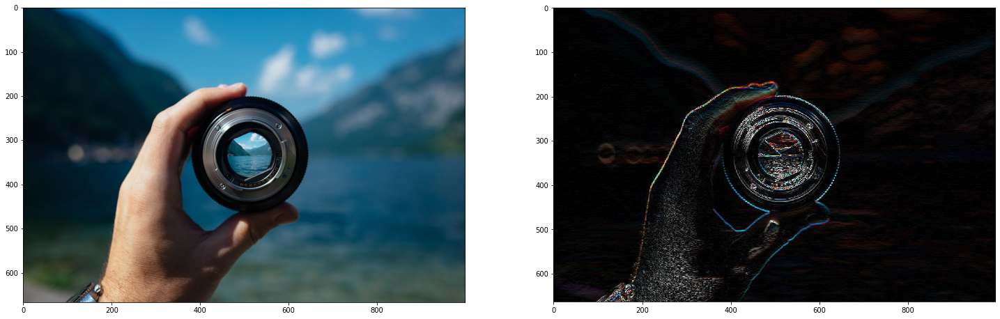

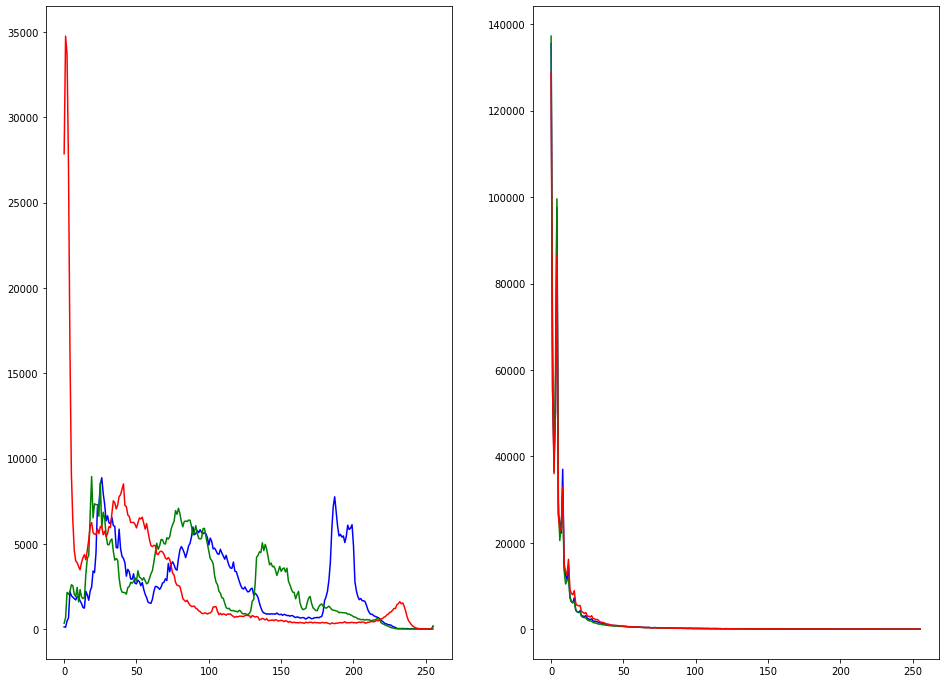

In [19]:
def plotHist(img, outImg):
    colours = ('b', 'g', 'r')
    fig = plt.figure(figsize=(16, 12))
    ax1, ax2= fig.add_subplot(121), fig.add_subplot(122)
    for i, colour in enumerate(colours):
        hist1 = cv2.calcHist([img], [i], None, [256], [0,256])
        hist2 = cv2.calcHist([outImg], [i], None, [256], [0,256])
        ax1.plot(hist1, color = colour)
        ax2.plot(hist2, color = colour)
    fig.show()

for counter in range(0, 4):
    input = images[os.listdir("images")[counter]]
    Gy = np.array([[1.0, 2.0, 1.0], [0.0/8, 0.0, 0.0], [-1.0, -2.0, -1.0]])
    output = convolution2(input, Gy)
    plotHist(input, np.float32(output))
    

<b style="font-size:18px;">Exercise 1.4: Different Convolution Kernels</b>

Apply Bilinear and Gaussian kernels to the previous exercise. <i style="color:red">(You should have three in total including Sobel)<i>
    
Document the results and compare the effect that the convolution of these kernel has on the image. 
    
You may initially use histograms to compare pixel values and intensity, you should also visually compare the results and discuss what potential effect this might have in terms of feature extraction and/or feature understanding. <i style="color:red">(We know that at this point this is your opinion. We are looking for insights on what you think no answer is completely right or wrong)</i><i style="color:red">Use the images provided on VLE</i>
    
<i style="color:red">Use the images provided on VLE</i>

#### Bilinear kernel

##### Implementation 

To apply the bilinear kernel the same method as above was used. 

As we can see from the resultant histograms, the kernel appears to be cutting off the extreme values, consequentially shifting and reducing the intensity of the image. My assumption is that this is being done to balance the image, as there is no longer such an overwhelming amount of the same value. This might make it easier to perform other functions down the line.

C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\1974327984.py:37: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\493838762.py:10: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\1974327984.py:37: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\493838762.py:10: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\1974327984.py:37: UserWarning: Matplotlib is currently using mod

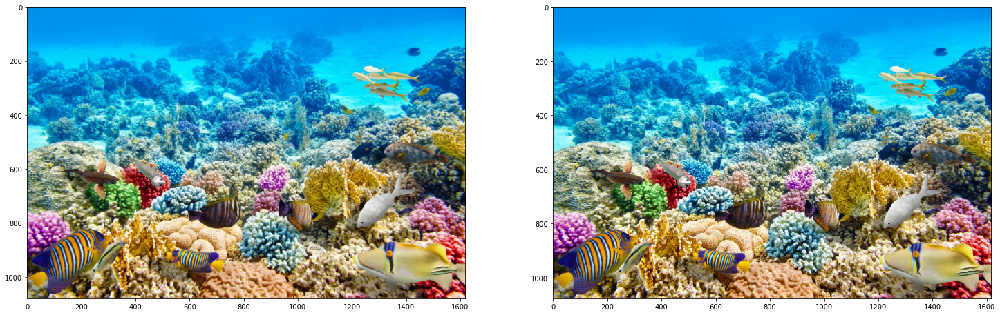

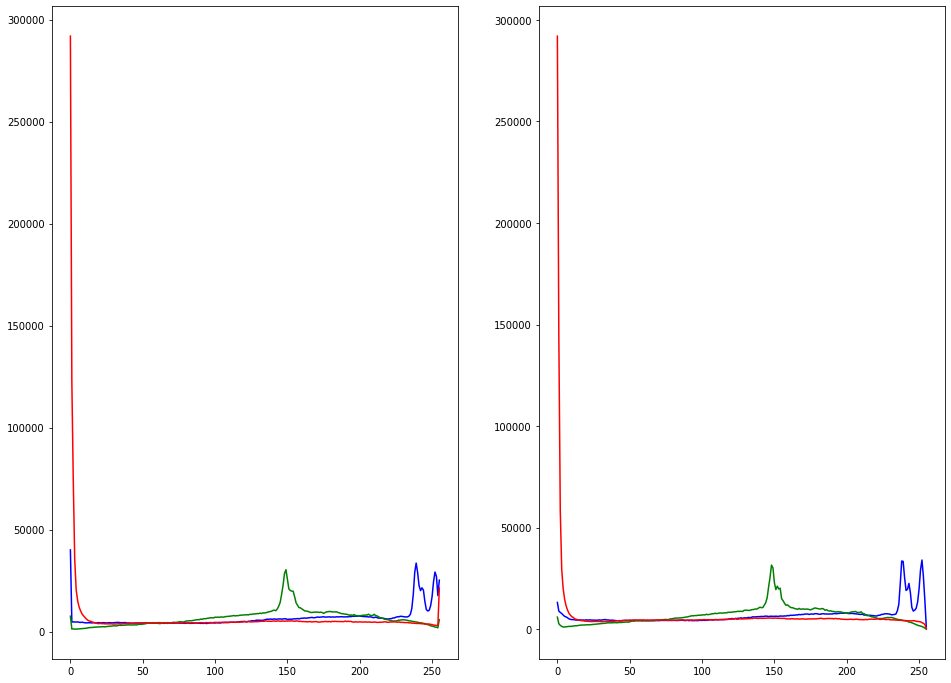

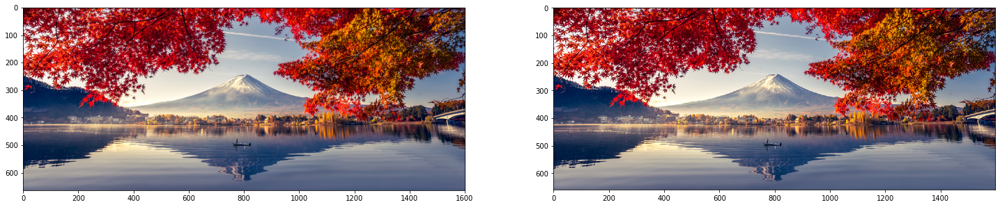

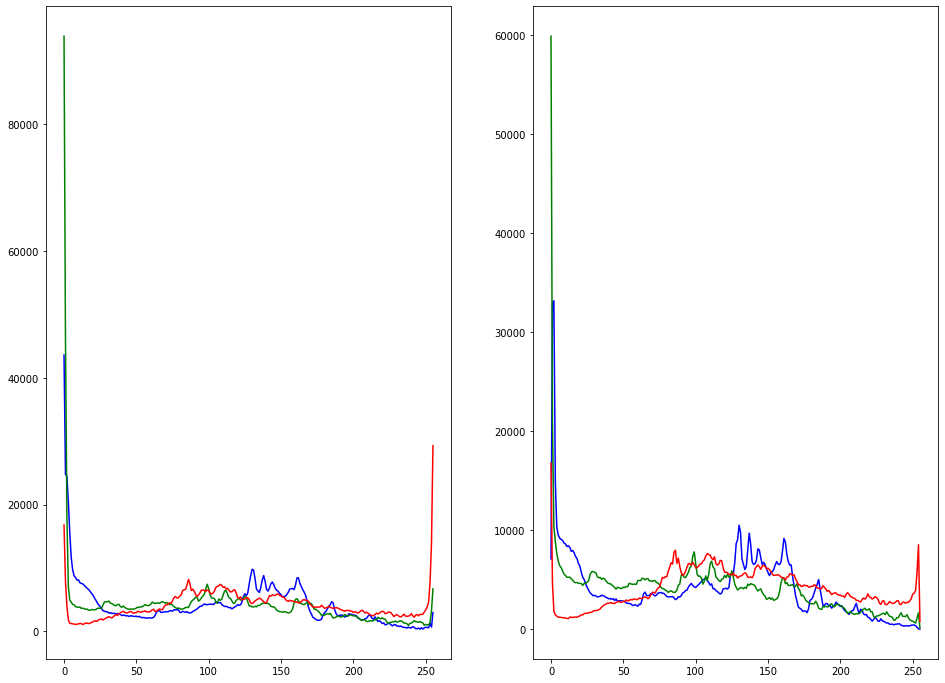

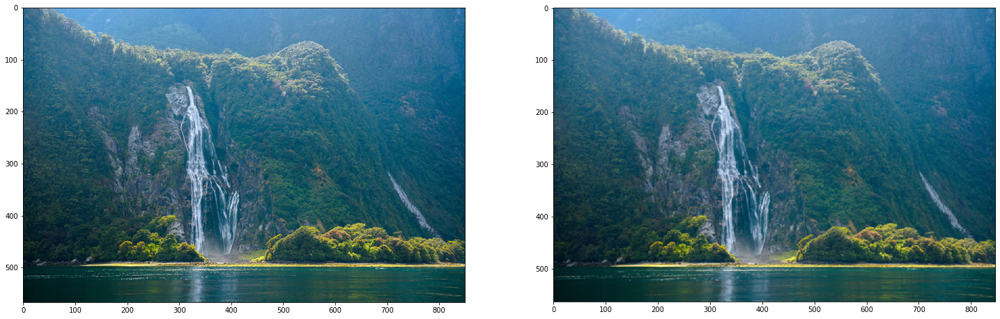

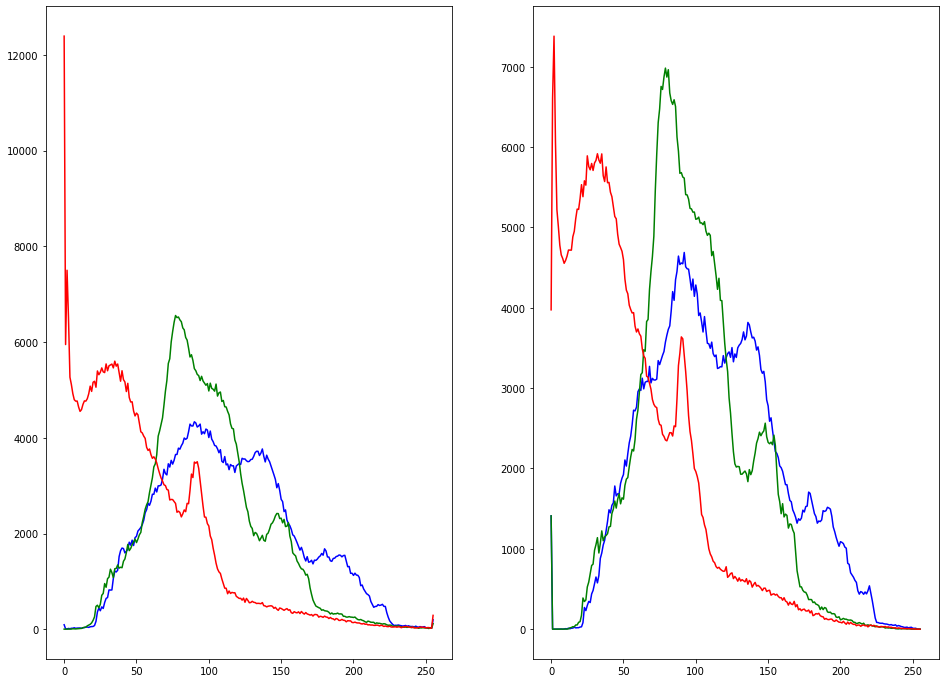

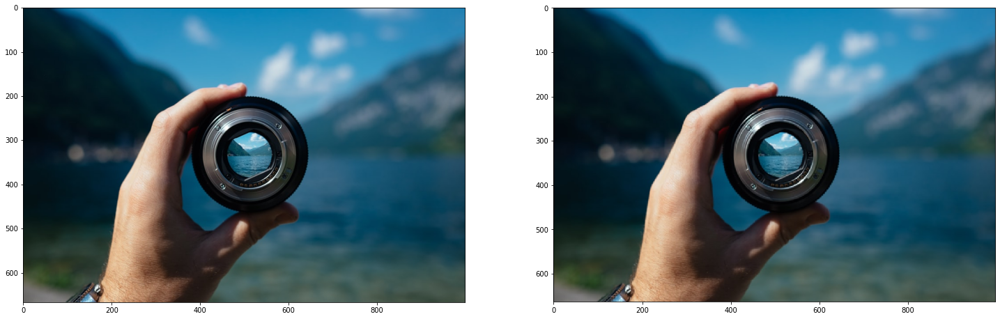

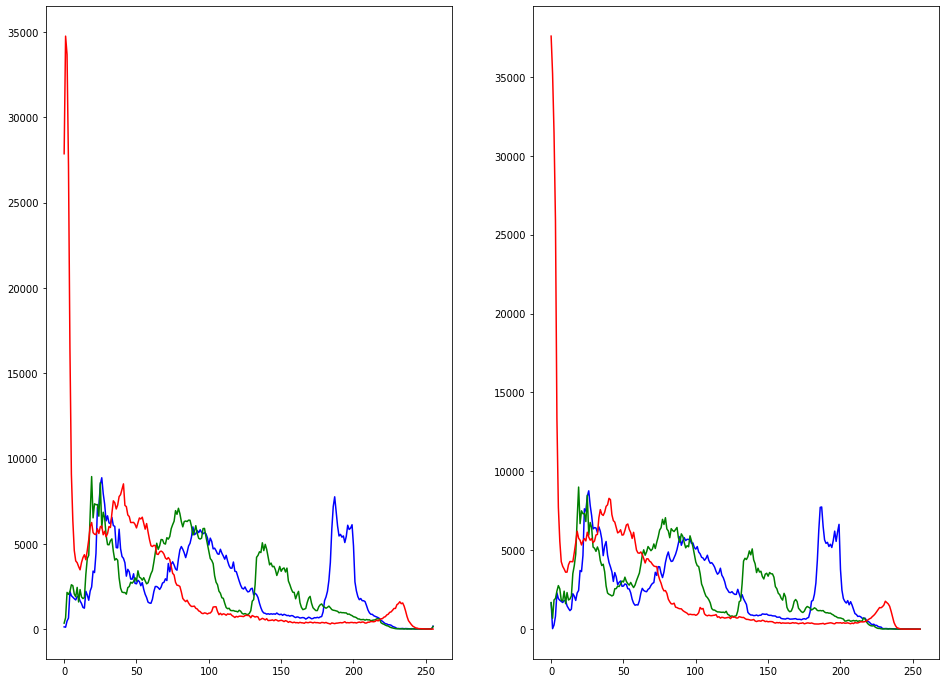

In [20]:
for counter in range(0, 4):
    input = images[os.listdir("images")[counter]]
    Gy = np.array([[1/16, 2/16, 1/16], [2/16, 4/16, 2/16], [1/16, 2/16, 1/16]])
    output = convolution2(input, Gy)
    plotHist(input, np.float32(output))

#### Gaussian Kernel

##### Implementation

To implement the gaussian kernel the convolution2 function was used. Furthermore, a new function called GaussianBlurImage was created. The function takes in, the image to be blurred, and a sigma value. The sigma value will indicate how blurred an image will be. The function starts by calculating the kernel for the given sigma value, it then calls the convolution2 function to convolute the image.

As we can see from the resultant histograms, blurring the image using the gaussian kernel drastically levels out any extreme values, as it averages them out with the results around it. My assumption is that this kernel can be used to remove details that are not needed for a particular implementation. This might make an image easier to work with. Furthermore, there is the ability to apply the kernel to a sensitive image, or section of an image, so it is not displayed to users. 

In [23]:
def GaussianBlurImage(image, sigma):
    image = np.asarray(image)
    #print(image)
    filter_size = 2 * int(4 * sigma + 0.5) + 1
    gaussian_filter = np.zeros((filter_size, filter_size), np.float32)
    m = filter_size//2
    n = filter_size//2
    
    for x in range(-m, m+1):
        for y in range(-n, n+1):
            x1 = 2*np.pi*(sigma**2)
            x2 = np.exp(-(x**2 + y**2)/(2* sigma**2))
            gaussian_filter[x+m, y+n] = (1/x1)*x2
    
    im_filtered = np.zeros_like(image, dtype=np.float32)
    im_filtered = convolution2(image, gaussian_filter)    
    return im_filtered

C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\1974327984.py:37: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\493838762.py:10: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\1974327984.py:37: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\493838762.py:10: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\maxma\AppData\Local\Temp\ipykernel_12020\1974327984.py:37: UserWarning: Matplotlib is currently using mod

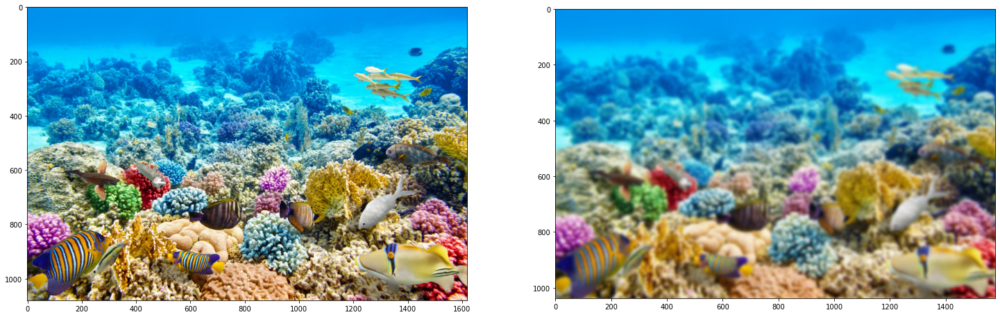

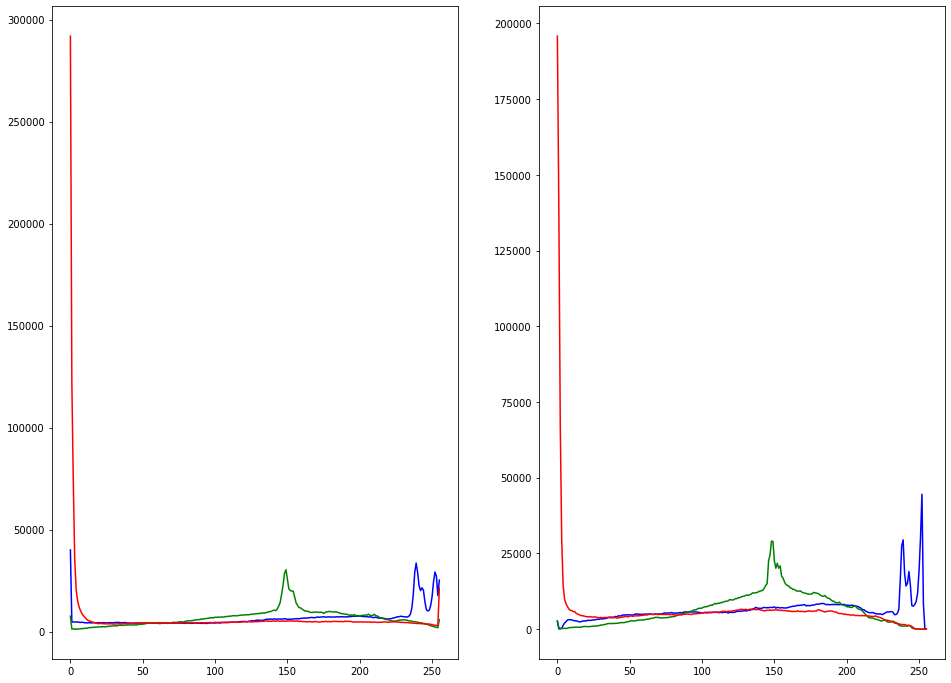

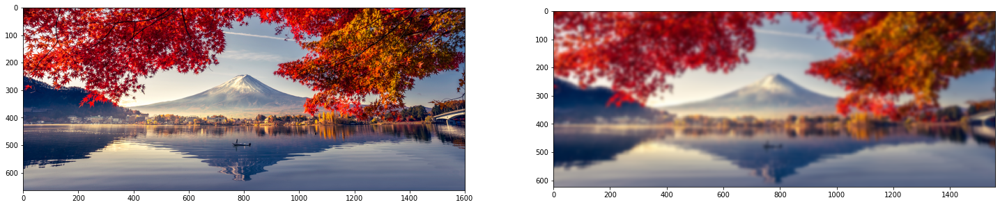

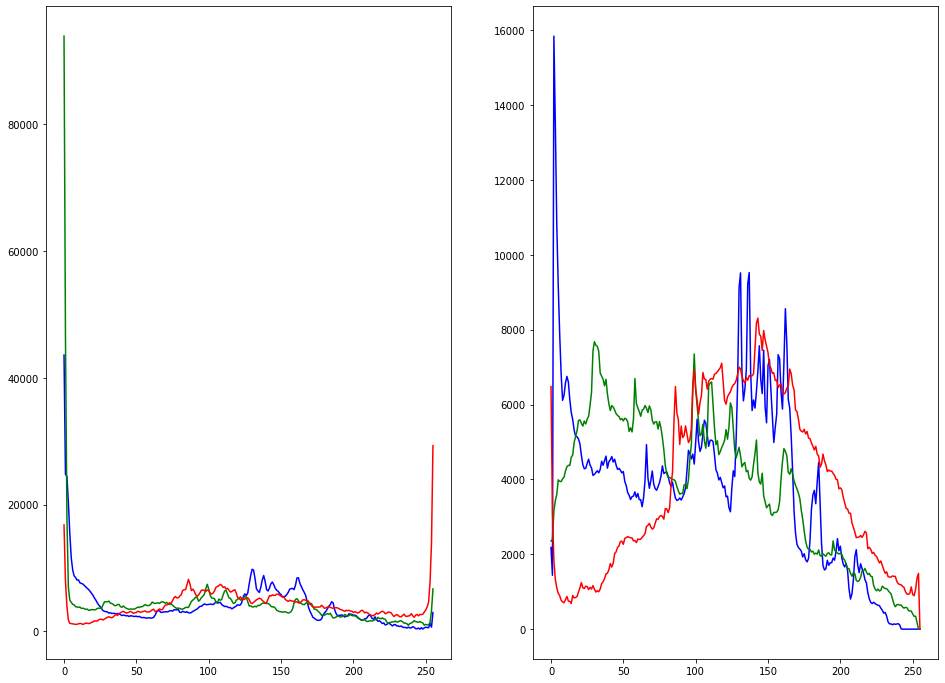

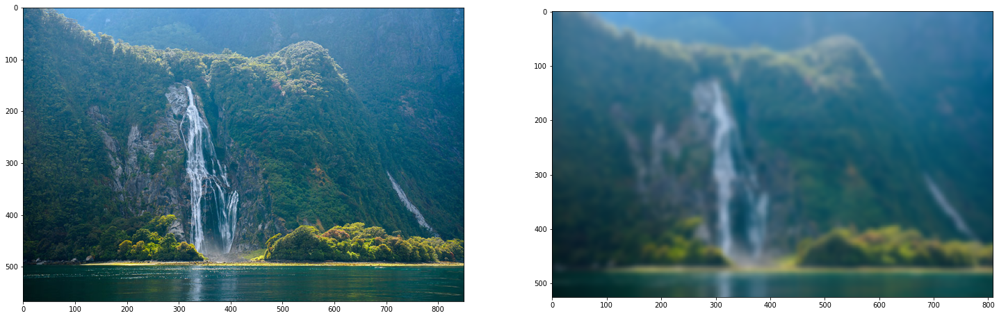

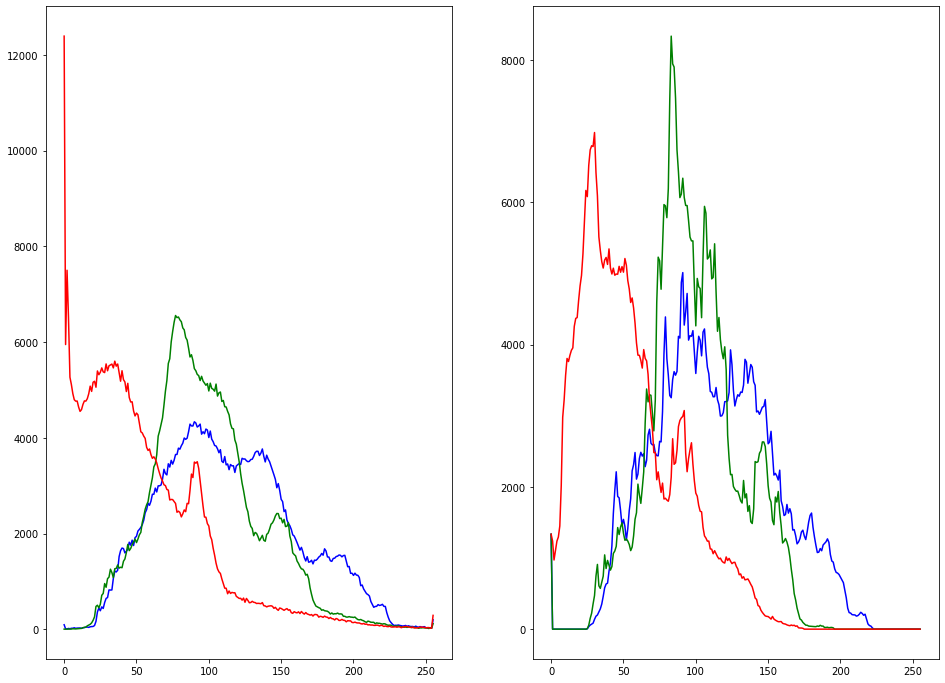

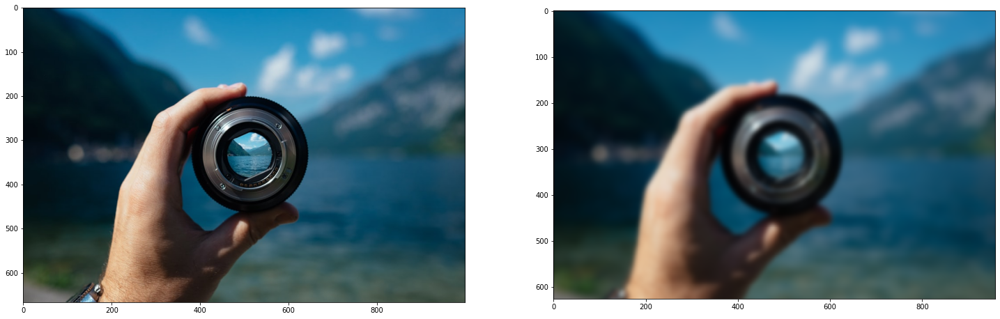

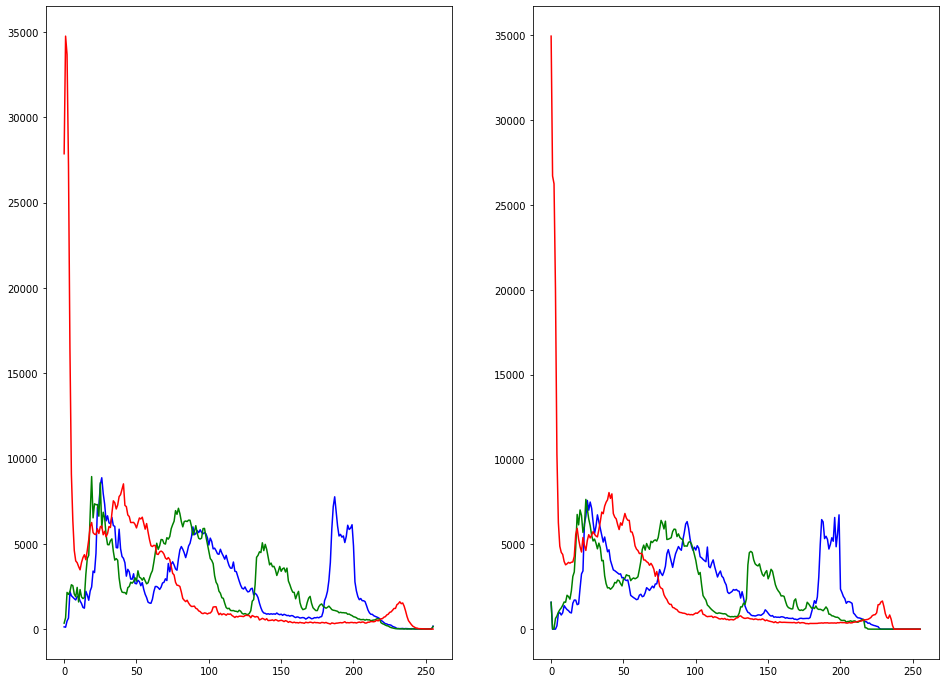

In [26]:
for counter in range(0, 4):
    input = images[os.listdir("images")[counter]]
    im = GaussianBlurImage(images[os.listdir("images")[counter]], 5)
    plotHist(input, np.float32(im))
    